In [ ]:
!pip install -U tf-keras-vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 1.8 MB/s eta 0:00:00


In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import os
import pickle

warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

from __future__ import print_function
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K

from tensorflow.keras import activations



In [ ]:
from tf_keras_vis.activation_maximization import ActivationMaximization
#from tf_keras_vis.input_modifiers import Jitter
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.callbacks import Print
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear


In [ ]:
!pip install --upgrade tensorflow keras

In [ ]:
def smooth_curve(points, factor=0.8):
    smoothed = []
    for point in points:
        if smoothed:
            previous = smoothed[-1]
            smoothed.append(previous * factor + point * (1 - factor))
        else:
            smoothed.append(point)
    return smoothed

def plot_compare(history, steps=-1):
    if steps < 0:
        steps = len(history.history['accuracy'])
    acc = smooth_curve(history.history['accuracy'][:steps])
    val_acc = smooth_curve(history.history['val_accuracy'][:steps])
    loss = smooth_curve(history.history['loss'][:steps])
    val_loss = smooth_curve(history.history['val_loss'][:steps])

    plt.figure(figsize=(6, 4))
    plt.plot(loss, c='#0c7cba', label='Train Loss')
    plt.plot(val_loss, c='#0f9d58', label='Val Loss')
    plt.xticks(range(0, len(loss), 5))
    plt.xlim(0, len(loss))
    plt.title('Train Loss: %.3f, Val Loss: %.3f' % (loss[-1], val_loss[-1]), fontsize=12)
    plt.legend()

    plt.figure(figsize=(6, 4))
    plt.plot(acc, c='#0c7cba', label='Train Acc')
    plt.plot(val_acc, c='#0f9d58', label='Val Acc')
    plt.xticks(range(0, len(acc), 5))
    plt.xlim(0, len(acc))
    plt.title('Train Accuracy: %.3f, Val Accuracy: %.3f' % (acc[-1], val_acc[-1]), fontsize=12)
    plt.legend()

def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def save_history(history, fn):
    with open(fn, 'wb') as fw:
        pickle.dump(history.history, fw, protocol=2)

def load_history(fn):
    class Temp():
        pass
    history = Temp()
    with open(fn, 'rb') as fr:
        history.history = pickle.load(fr)
    return history

def jitter(img, amount=32):
    ox, oy = np.random.randint(-amount, amount+1, 2)
    return np.roll(np.roll(img, ox, -1), oy, -2), ox, oy

def reverse_jitter(img, ox, oy):
    return np.roll(np.roll(img, -ox, -1), -oy, -2)

def plot_image(img):
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2), name='maxpool_1'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model.add(MaxPooling2D((2, 2), name='maxpool_2'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model.add(MaxPooling2D((2, 2), name='maxpool_3'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model.add(MaxPooling2D((2, 2), name='maxpool_4'))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu', name='dense_1'))
model.add(Dense(256, activation='relu', name='dense_2'))
model.add(Dense(1, activation='sigmoid', name='output'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
!pip install kaggle

In [ ]:
!kaggle datasets download -d jhe2918/cats-and-dogs-small

Dataset URL: https://www.kaggle.com/datasets/jhe2918/cats-and-dogs-small
License(s): unknown
 99% 86.0M/86.7M [00:04<00:00, 23.2MB/s]
100% 86.7M/86.7M [00:04<00:00, 18.6MB/s]


In [ ]:
!unzip cats-and-dogs-small.zip -d /content

Archive:  cats-and-dogs-small.zip
  inflating: /content/cats_and_dogs_small/test/cats/cat.1500.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1501.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1502.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1503.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1504.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1505.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1506.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1507.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1508.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1509.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1510.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1511.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1512.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1513.jpg  
  inflating: /content/cats_a

In [ ]:
#!kaggle datasets download -d hongweicao/catanddogsmall

Dataset URL: https://www.kaggle.com/datasets/hongweicao/catanddogsmall
License(s): unknown
 96% 118M/122M [00:01<00:00, 87.5MB/s]
100% 122M/122M [00:01<00:00, 64.5MB/s]


In [ ]:
#!unzip catanddogsmall.zip -d /content/cats_and_dogs_small


Archive:  catanddogsmall.zip
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1500.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1501.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1502.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1503.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1504.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1505.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1506.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1507.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1508.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1509.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1510.jpg  
  inflating: /content/cats_and_dogs_small/dogvscat_small/test/cats/1511.jpg  
  inflating: /content/cats_and_dogs

In [ ]:
#base_dir = '/content/cats_and_dogs_small/dogvscat_small'
base_dir = '/content/cats_and_dogs_small'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
history = model.fit(train_generator, steps_per_epoch=100, epochs=20, validation_data=validation_generator, validation_steps=50, verbose=1)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - accuracy: 0.4989 - loss: 0.6986 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 176us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step - accuracy: 0.4959 - loss: 0.6935 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.4969 - loss: 0.6932 - val_accuracy: 0.5020 - val_loss: 0.6931
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.4948 - loss: 0.6933 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 9/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.5015 - loss: 0.6939 - val_accur

In [ ]:
model.save('model.h5')
save_history(history, 'history.bin')

In [ ]:
print(history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


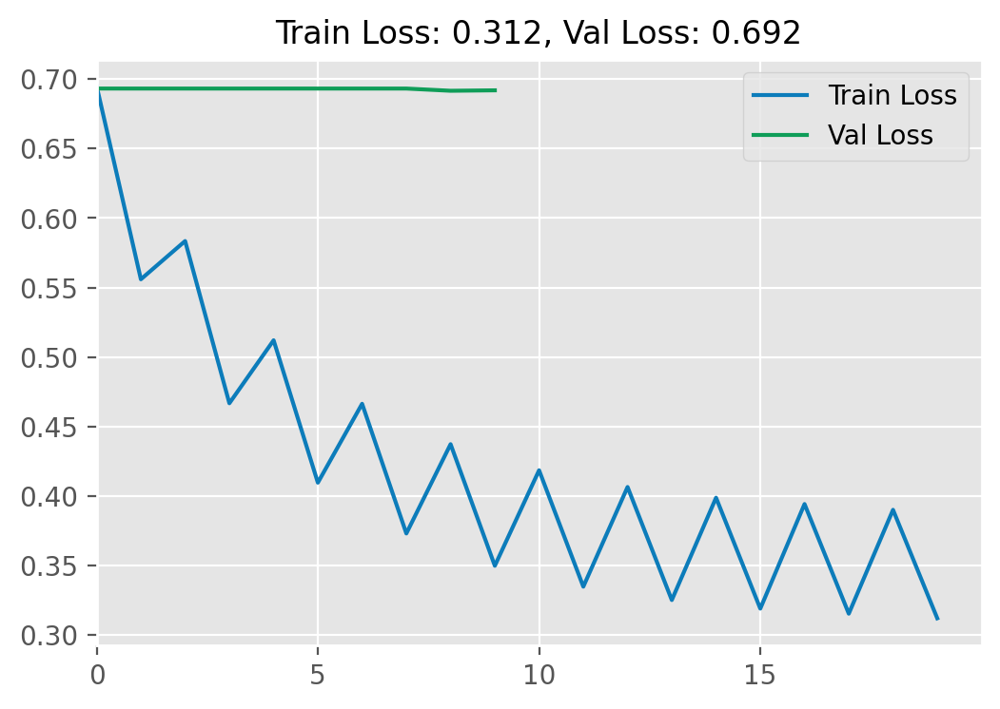

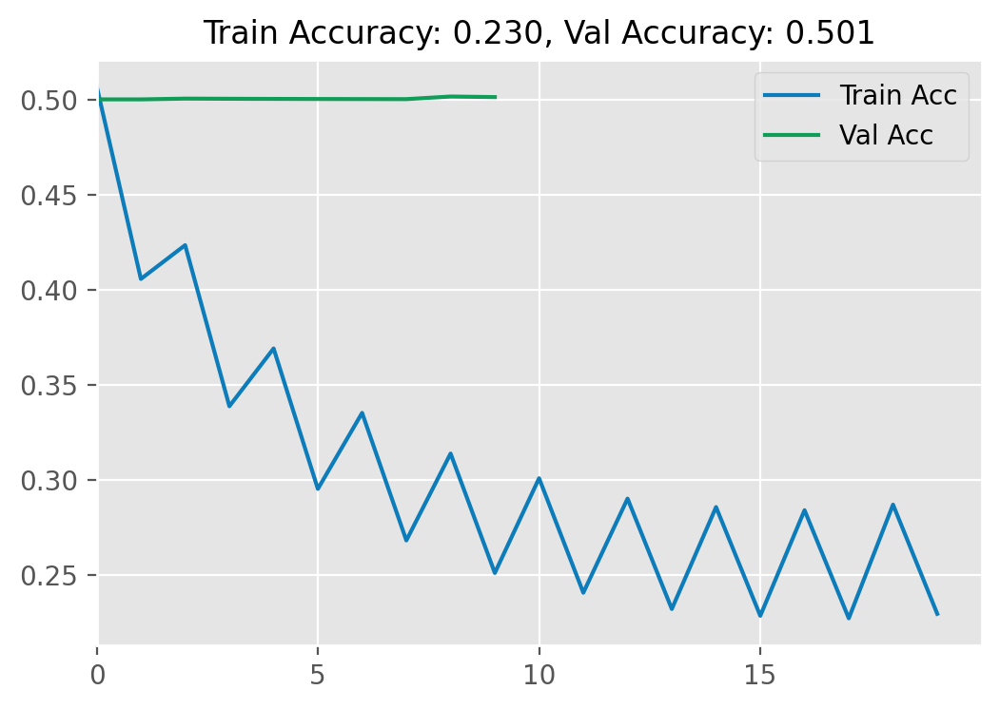

In [ ]:
history = load_history('history.bin')
plot_compare(history)

In [ ]:
model_aug = Sequential()
model_aug.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_1'))
model_aug.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_2'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_3'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_4'))
model_aug.add(Flatten())
model_aug.add(Dropout(0.5))
model_aug.add(Dense(512, activation='relu', name='dense_1'))
model_aug.add(Dense(256, activation='relu', name='dense_2'))
model_aug.add(Dense(1, activation='sigmoid', name='output'))

In [ ]:
model_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

# early_stop = EarlyStopping(monitor='val_loss', patience=6, verbose=1)
history_aug = model_aug.fit(train_generator, steps_per_epoch=100, epochs=60, validation_data=validation_generator, validation_steps=50, verbose=0)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
model_aug.save('model_aug.h5')
save_history(history_aug, 'history_aug.bin')

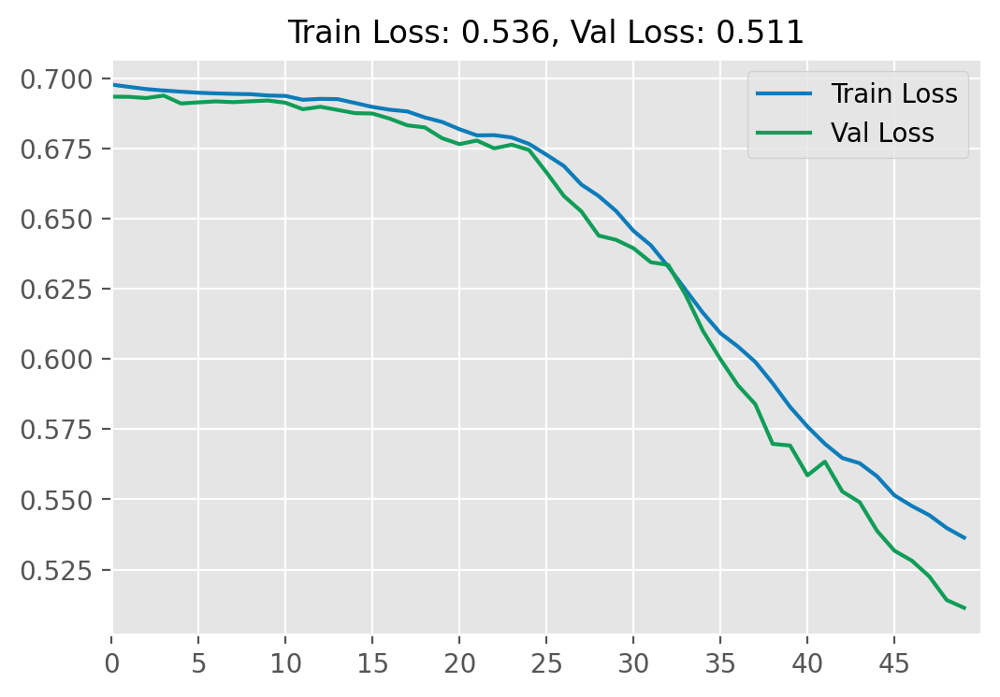

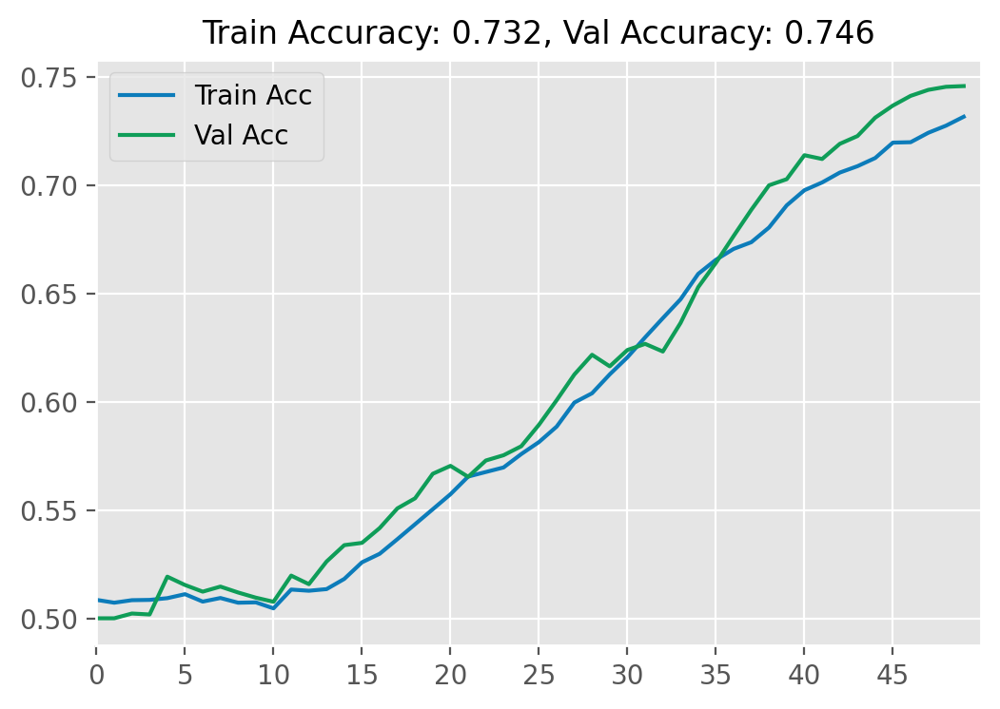

In [ ]:
history_aug = load_history('history_aug.bin')
plot_compare(history_aug, steps=50)

###Visualizing Feature Maps

In [ ]:
img_path = '/content/cats_and_dogs_small/train/cats/cat.110.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


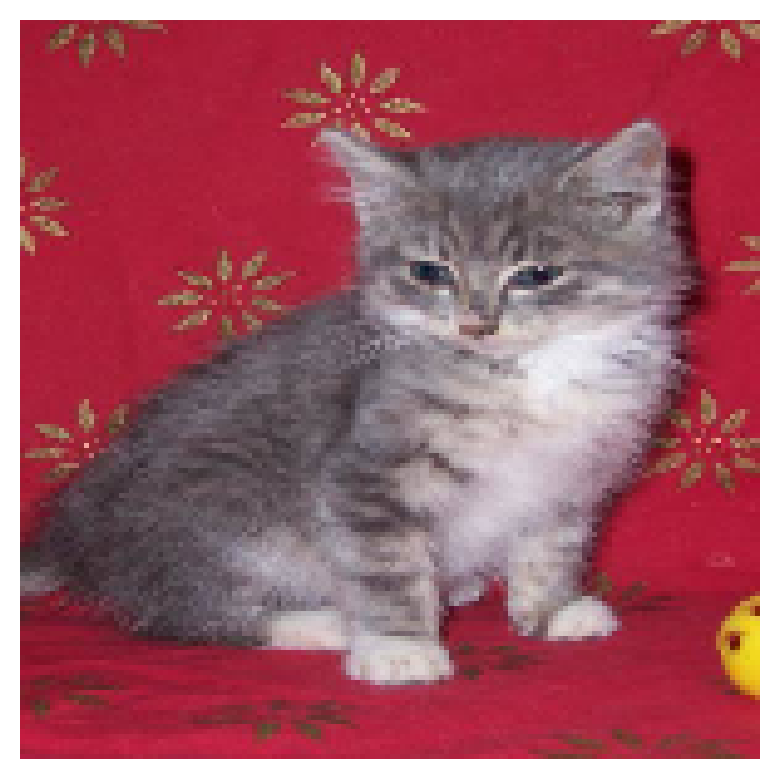

In [ ]:
plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

In [ ]:
vgg = VGG16(weights='imagenet', include_top=False)
vgg.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


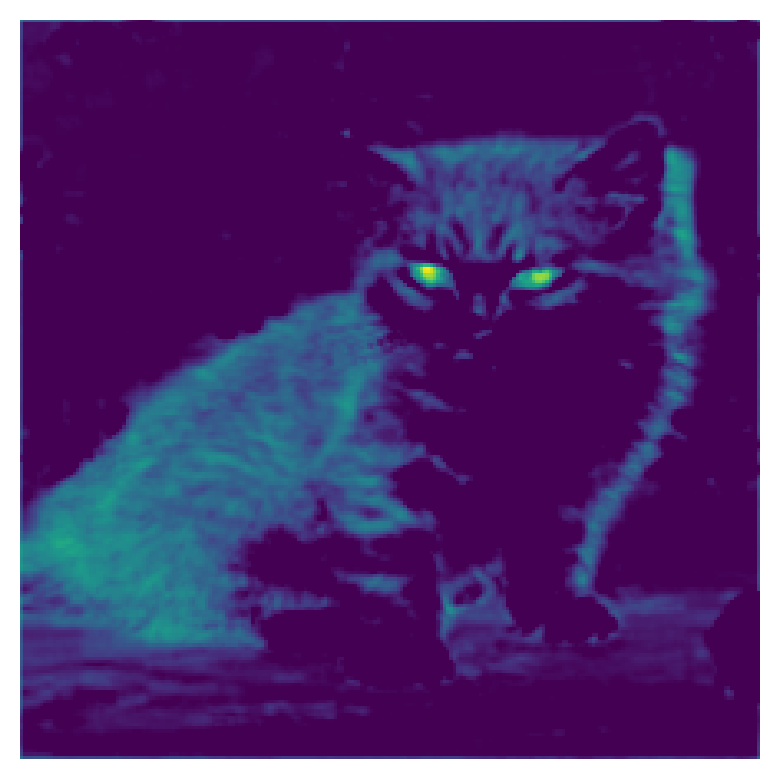

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in vgg.layers if 'conv1' in layer.name]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

first_layer_activation = intermediate_activations[0]

plt.imshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


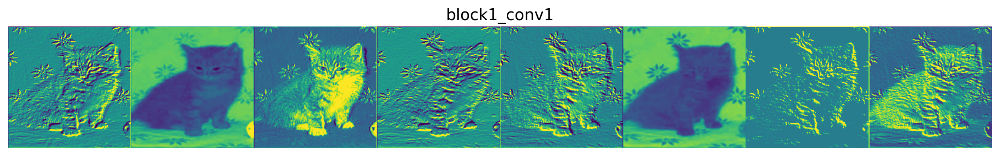

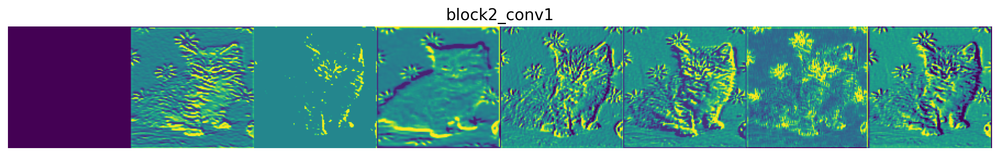

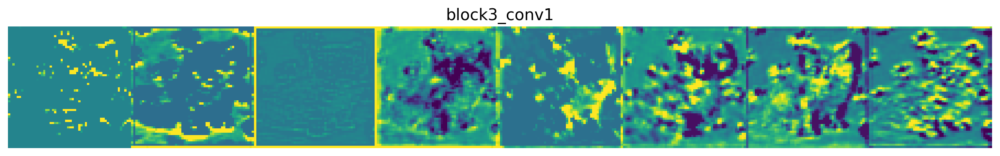

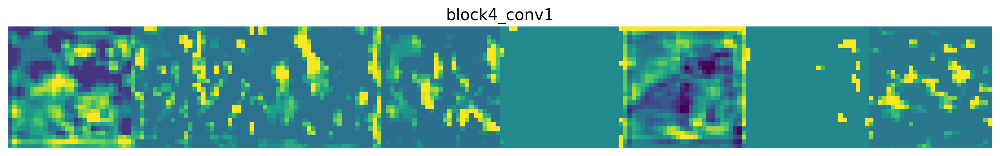

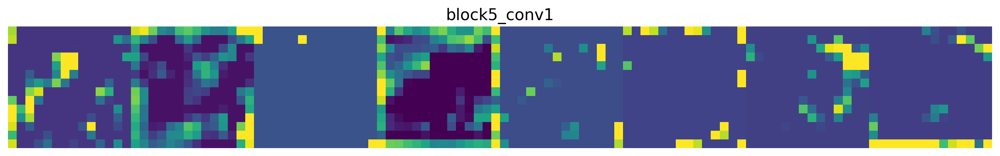

In [ ]:
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

layer_outputs = [layer.output for layer in vgg.layers if layer.name in layer_names]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

images_per_row = 8
max_images = 8
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, intermediate_activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]
    n_features = min(n_features, max_images)

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 2. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.axis('off')
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

###Dense Layer Visualization

In [ ]:
from tensorflow.keras.applications.vgg16 import decode_predictions

# Cargar el modelo VGG16 con las capas densas finales
model = VGG16(weights='imagenet', include_top=True)

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


Probando, no correr

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import activations
import matplotlib.pyplot as plt


# Encontrar el índice de la última capa
layer_idx = -1

# Cambiar la activación de la última capa a lineal
model.layers[layer_idx].activation = activations.linear

# Aplicar los cambios al modelo
model = tf.keras.models.clone_model(
    model,
    input_tensors=None,
    clone_function=None
)
model.set_weights(model.get_weights())

# Función para visualizar activaciones
def visualize_activation(model, layer_idx, filter_index, steps=2000, learning_rate=0.001):
    """
    Visualiza la activación de un filtro específico en una capa dada.
    """
    # Inicializa con una imagen más suave en lugar de ruido aleatorio
    input_img_data = tf.Variable(np.ones((1, 224, 224, 3)) * 128., dtype=tf.float32)

    for step in range(steps):
        with tf.GradientTape() as tape:
            tape.watch(input_img_data)
            preds = model(input_img_data)
            loss = tf.reduce_mean(preds[..., filter_index])  # Regularización L2 puede añadirse aquí

            # Añadir regularización L2
            loss += 1e-4 * tf.reduce_sum(tf.square(input_img_data))

        grads = tape.gradient(loss, input_img_data)
        grads /= (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)

        # Aplica la actualización a la imagen de entrada con una tasa de aprendizaje ajustada
        input_img_data.assign_add(grads * learning_rate)

    # Normalizar la imagen resultante
    img = input_img_data[0].numpy()
    img = (img - img.mean()) / (img.std() + 1e-5)
    img = img * 0.25 + 0.5
    img = np.clip(img, 0, 1)

    return img

# Visualizar activación para el filtro de índice 20 (categoría 'ouzel' en ImageNet)
img = visualize_activation(model, layer_idx, filter_index=20)

# Mostrar la imagen
plt.imshow(img)
plt.axis('off')
plt.show()


KeyboardInterrupt: 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


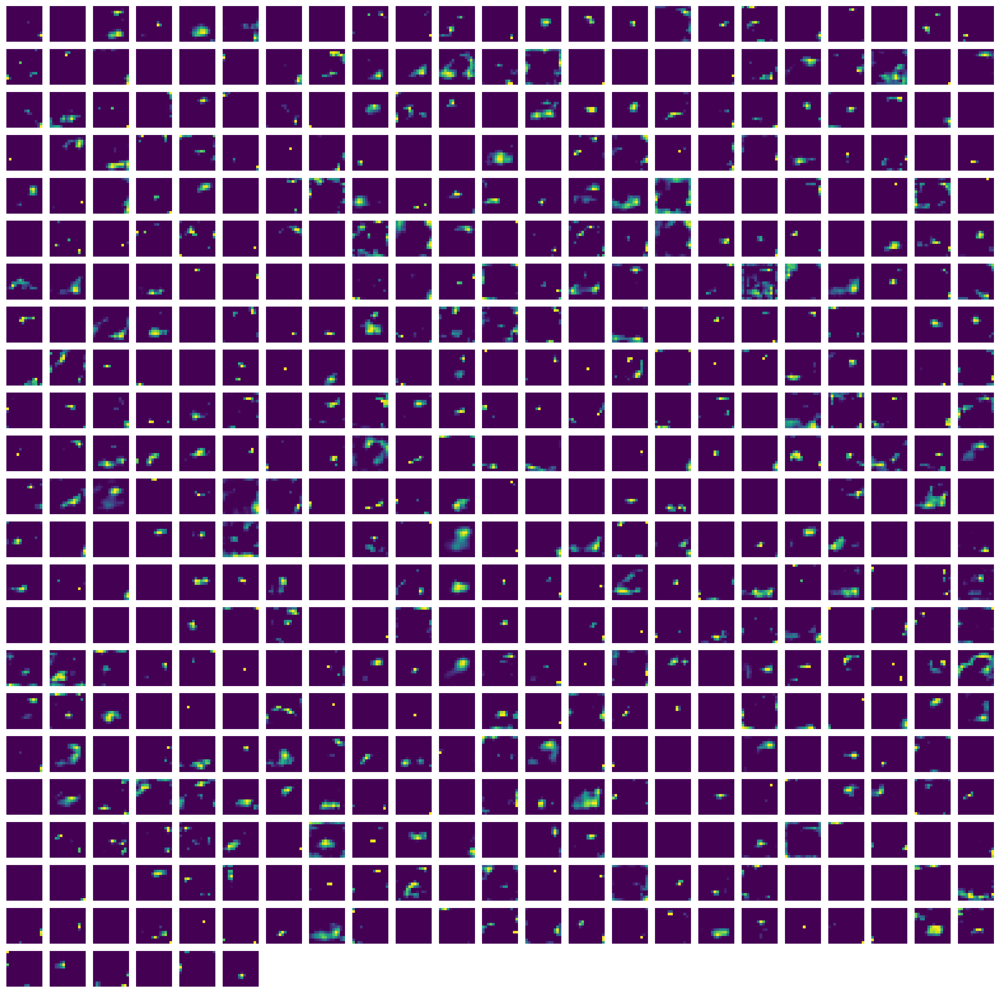

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import math

# Seleccionar una capa convolucional para visualizar
# Debes elegir una capa convolucional, por ejemplo, 'block5_conv3'
layer_name = 'block5_conv3'  # Cambia esto por la capa que desees visualizar
activation_model = Model(inputs=model.input,
                         outputs=model.get_layer(layer_name).output)

# Cargar y preprocesar la imagen
img_path = '/content/cats_and_dogs_small/train/cats/cat.110.jpg'  # Cambia esto por la ruta de tu imagen
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Obtener las activaciones
activations = activation_model.predict(img_array)

# Visualizar las activaciones
num_filters = activations.shape[-1]
grid_size = int(math.ceil(math.sqrt(num_filters)))

fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))
axes = axes.flatten()

for i in range(num_filters):
    ax = axes[i]
    ax.imshow(activations[0, :, :, i], cmap='viridis')
    ax.axis('off')

# Ocultar los ejes adicionales si hay menos filtros que celdas en la cuadrícula
for j in range(num_filters, len(axes)):
    axes[j].axis('off')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


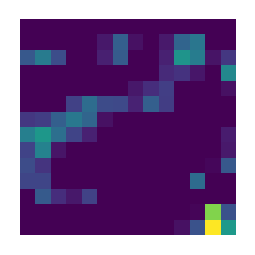

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model


# Seleccionar una capa convolucional para visualizar
# Debes elegir una capa convolucional, por ejemplo, 'block5_conv3'
layer_name = 'block5_conv1'  # Cambia esto por la capa que desees visualizar
activation_model = Model(inputs=model.input,
                         outputs=model.get_layer(layer_name).output)

# Cargar y preprocesar la imagen
img_path = '/content/cats_and_dogs_small/train/cats/cat.110.jpg'  # Cambia esto por la ruta de tu imagen
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Obtener las activaciones
activations = activation_model.predict(img_array)
# Seleccionar el índice del filtro que deseas visualizar
filter_index = -3  # Cambia esto al índice del filtro que quieres visualizar

# Visualizar solo una imagen de activación
activation_image = activations[0, :, :, filter_index]
plt.figure(figsize=(activation_image.shape[1] / 10, activation_image.shape[0] / 10))  # Ajusta el tamaño de la figura
plt.imshow(activation_image, cmap='viridis')
plt.axis('off')  # Ocultar los ejes
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


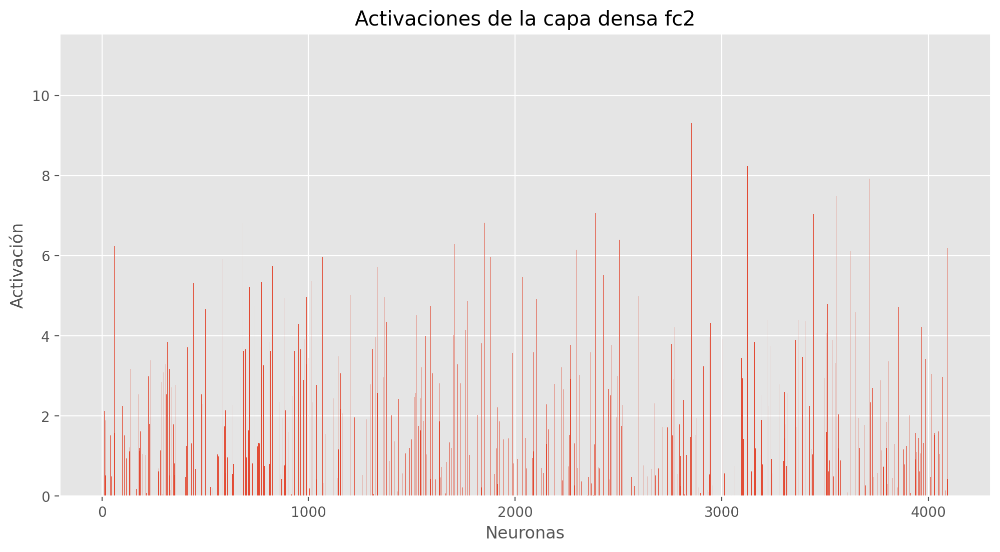

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

# Seleccionar la capa densa para visualizar
layer_name = 'fc2'  # Cambia esto por la capa densa que desees visualizar
activation_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

# Cargar y preprocesar la imagen
img_path = '/content/cats_and_dogs_small/train/cats/cat.110.jpg'  # Cambia esto por la ruta de tu imagen
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Obtener las activaciones de la capa densa
activations = activation_model.predict(img_array)

# Visualizar las activaciones de la capa densa
num_neurons = activations.shape[-1]

plt.figure(figsize=(12, 6))
plt.bar(range(num_neurons), activations[0, :])
plt.xlabel('Neuronas')
plt.ylabel('Activación')
plt.title(f'Activaciones de la capa densa {layer_name}')
plt.show()


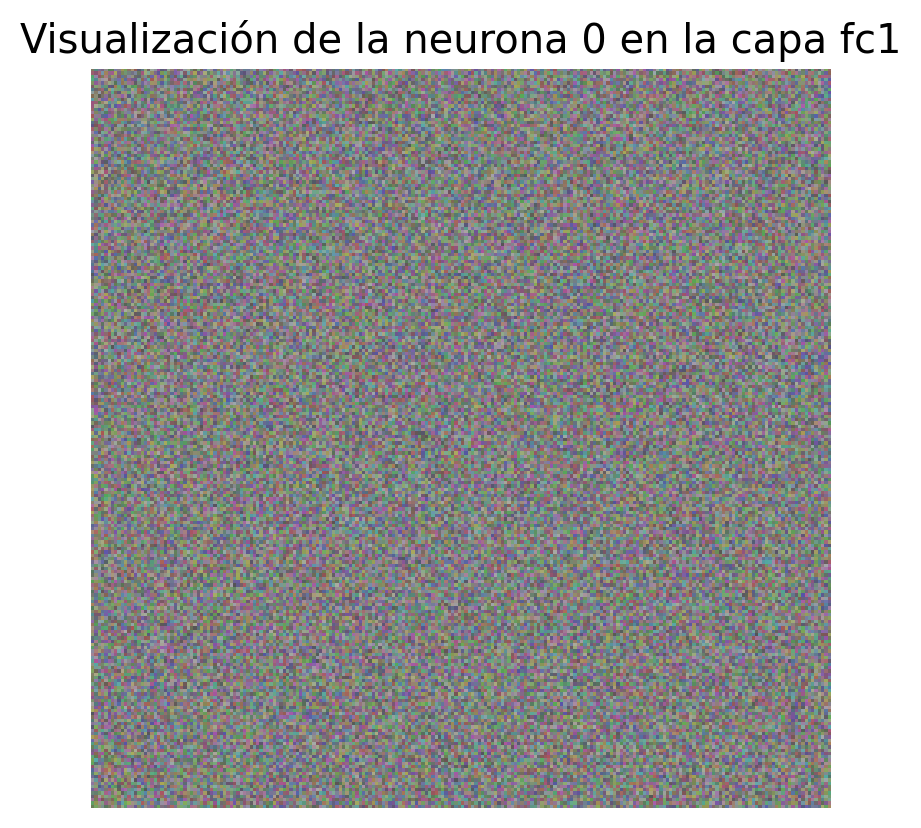

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
import matplotlib.pyplot as plt


# Seleccionar una capa densa para visualizar
layer_name = 'fc1'  # Cambia esto por la capa que desees visualizar
layer_output = model.get_layer(layer_name).output

# Seleccionar un índice de neurona para maximizar
neuron_index = 0  # Cambia esto por el índice de la neurona que desees visualizar

# Generar una imagen de entrada aleatoria
input_img_data = np.random.random((1, 224, 224, 3)) * 20 + 128.
input_img_data = tf.Variable(input_img_data, dtype=tf.float32)

# Número de pasos de ascenso de gradiente
step = 1.
for i in range(40):
    with tf.GradientTape() as tape:
        preds = model(input_img_data)
        loss = tf.reduce_mean(preds[:, neuron_index])
    grads = tape.gradient(loss, input_img_data)
    grads /= (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)
    input_img_data.assign_add(grads * step)

# Convertir la imagen de entrada en una imagen válida
def deprocess_image(x):
    x = x.numpy()
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Visualizar la imagen que maximiza la activación de la neurona seleccionada
img = input_img_data[0]
img = deprocess_image(img)

plt.imshow(img)
plt.title(f'Visualización de la neurona {neuron_index} en la capa {layer_name}')
plt.axis('off')
plt.show()

In [ ]:
def generate_activation_image(model, layer_name, filter_index, max_iter=400, jitter=16):
    # Define a model that outputs the activation of the specified layer
    layer_output = model.get_layer(layer_name).output
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_output)

    # Create a trainable image variable
    img_tensor = tf.Variable(np.random.random((1, 224, 224, 3)), dtype=tf.float32)

    # Define the optimizer
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)

    # Define the loss function
    def loss_function():
        activation = activation_model(img_tensor)
        # Maximize the activation of the specific filter
        return -tf.reduce_mean(activation[0, :, :, filter_index])

    # Optimization process
    for step in range(max_iter):
        with tf.GradientTape() as tape:
            loss = loss_function()
        gradients = tape.gradient(loss, [img_tensor])
        optimizer.apply_gradients(zip(gradients, [img_tensor]))

        if step % 50 == 0:
            print(f"Step {step}, Loss: {loss.numpy()}")

    # Get the final image tensor
    img_tensor = img_tensor.numpy().squeeze()

    # Normalize the image for visualization
    img_tensor -= img_tensor.mean()
    img_tensor /= img_tensor.std()
    img_tensor *= 64
    img_tensor += 128
    img_tensor = np.clip(img_tensor, 0, 255).astype('uint8')

    return img_tensor

def plot_image(image):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

Step 0, Loss: -0.00015059637371450663
Step 50, Loss: -0.007230522111058235
Step 100, Loss: -0.025498438626527786
Step 150, Loss: -0.05368466302752495
Step 200, Loss: -0.08450829982757568
Step 250, Loss: -0.1185477152466774
Step 300, Loss: -0.15352581441402435
Step 350, Loss: -0.18921169638633728


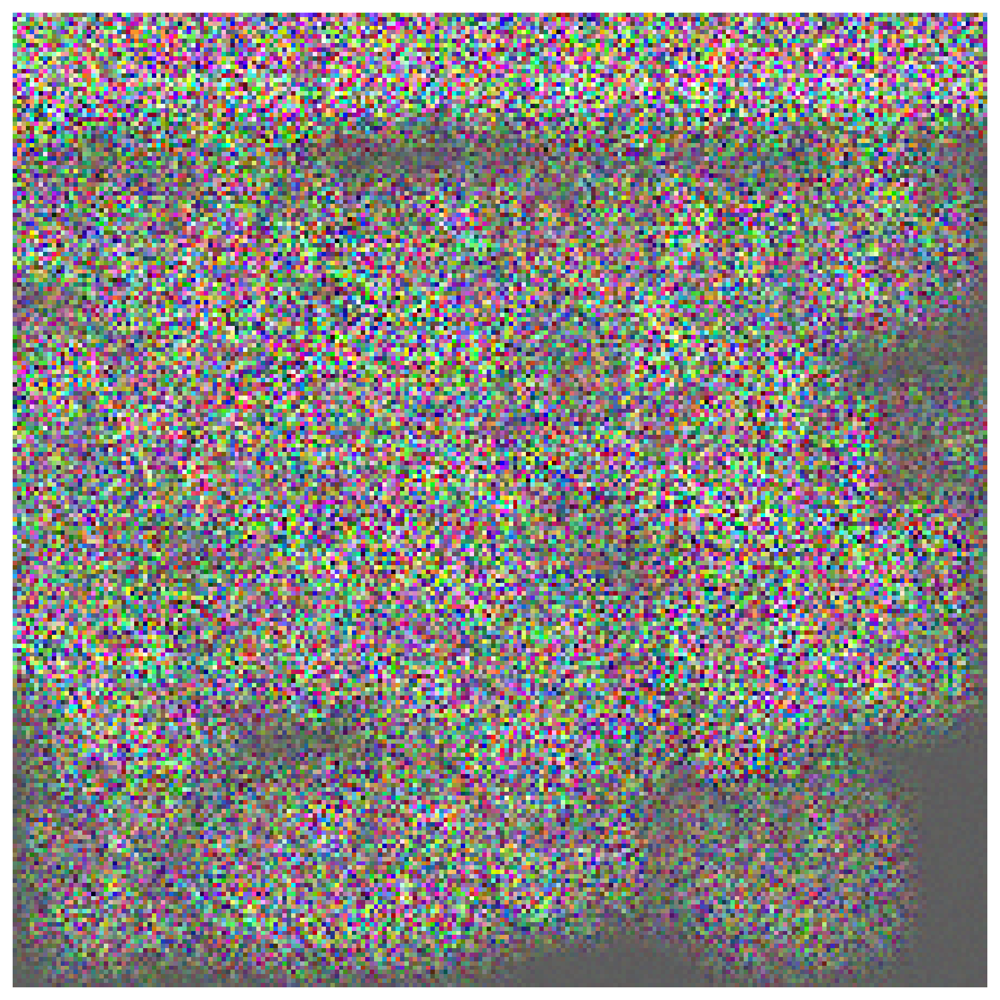

In [ ]:


# Parámetros
layer_name = 'block4_conv1'  # Cambia esto al nombre de la capa que quieras visualizar
filter_index = 20  # Cambia esto al índice del filtro que quieras visualizar

# Generar la imagen de activación
activation_image = generate_activation_image(model, layer_name, filter_index, max_iter=400, jitter=16)

# Visualizar la imagen de activación
plot_image(activation_image)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16
from PIL import Image, ImageDraw, ImageFont

In [ ]:
# Función para generar imágenes de activación
def generate_activation_image(model, layer_name, filter_index, initial_img=None, max_iter=300):
    layer_output = model.get_layer(layer_name).output
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_output)

    n_filters = layer_output.shape[-1]
    if filter_index >= n_filters:
        print(f"Filter index {filter_index} exceeds the number of filters ({n_filters}) in the layer '{layer_name}'.")
        return None

    if initial_img is None:
        img_tensor = tf.Variable(np.random.random((1, 224, 224, 3)), dtype=tf.float32)
    else:
        img_tensor = tf.Variable(np.expand_dims(initial_img, axis=0), dtype=tf.float32)

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)

    def loss_function():
        activation = activation_model(img_tensor)
        return -tf.reduce_mean(activation[0, :, :, filter_index])

    for step in range(max_iter):
        with tf.GradientTape() as tape:
            loss = loss_function()
        gradients = tape.gradient(loss, [img_tensor])
        optimizer.apply_gradients(zip(gradients, [img_tensor]))

        if step % 50 == 0:
            print(f"Step {step}, Loss: {loss.numpy()}")

    img_tensor = img_tensor.numpy().squeeze()
    img_tensor -= img_tensor.mean()
    img_tensor /= img_tensor.std()
    img_tensor *= 64
    img_tensor += 128
    img_tensor = np.clip(img_tensor, 0, 255).astype('uint8')

    return img_tensor

# Función para añadir texto a las imágenes
def add_text_to_image(image, text, position=(10, 10)):
    image_pil = Image.fromarray(image)
    draw = ImageDraw.Draw(image_pil)
    font = ImageFont.load_default()
    draw.text(position, text, font=font, fill=(255, 255, 255))
    return np.array(image_pil)

# Función para unir imágenes
def stitch_images(images, cols):
    rows = (len(images) + cols - 1) // cols
    width, height = images[0].shape[1], images[0].shape[0]
    stitched = np.zeros((rows * height, cols * width, 3), dtype=np.uint8)
    for i, img in enumerate(images):
        row, col = divmod(i, cols)
        stitched[row * height: (row + 1) * height, col * width: (col + 1) * width] = img
    return stitched

In [ ]:
# Datos iniciales
codes = '''
rabbit 330
crocodile 49
starfish 327
husky 248
goldfish 1
bridge 839
balloon 417
tennis ball 852
gondola 576
dumbbell 543
hammer 587
lamp 846
'''

model = VGG16(weights='imagenet', include_top=True)
layer_name = 'block5_conv3'  # Cambia esto al nombre de la capa que quieras visualizar

initial_images = []
images = []
labels = []

for line in codes.split('\n'):
    if not line:
        continue
    name, idx = line.rsplit(' ', 1)
    idx = int(idx)

    try:
        # Generar imagen inicial para el filtro
        img = generate_activation_image(model, layer_name, idx, max_iter=300)
        if img is not None:
            initial_images.append(img)
            labels.append(name)
    except ValueError as e:
        print(e)
        continue

for i, (name, idx) in enumerate([(line.rsplit(' ', 1)[0], int(line.rsplit(' ', 1)[1])) for line in codes.split('\n') if line]):
    try:
        img = generate_activation_image(model, layer_name, idx, initial_img=initial_images[i], max_iter=300)
        if img is not None:
            img = add_text_to_image(img, name)
            images.append(img)
    except IndexError as e:
        print(f"IndexError: {e}")
        continue

if images:
    stitched = stitch_images(images, cols=4)
    plt.figure(figsize=(20, 20))
    plt.axis('off')
    plt.imshow(stitched)
    plt.show()
else:
    print("No images to display.")

In [ ]:
# Función para obtener el número de filtros en una capa
def get_num_filters(layer):
    return layer.output_shape[-1]

# Función para visualizar activación de un filtro
def visualize_activation(model, layer_name, filter_index, tv_weight=0.1, input_modifiers=None, max_iter=300):
    layer_output = model.get_layer(layer_name).output
    activation_model = tf.keras.Model(inputs=model.input, outputs=layer_output)

    n_filters = layer_output.shape[-1]
    if filter_index >= n_filters:
        print(f"Filter index {filter_index} exceeds the number of filters ({n_filters}) in the layer '{layer_name}'.")
        return None

    img_tensor = tf.Variable(np.random.random((1, 224, 224, 3)), dtype=tf.float32)

    optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)

    def loss_function():
        activation = activation_model(img_tensor)
        return -tf.reduce_mean(activation[0, :, :, filter_index])

    @tf.function
    def optimize_step():
        with tf.GradientTape() as tape:
            loss = loss_function()
        gradients = tape.gradient(loss, [img_tensor])
        optimizer.apply_gradients(zip(gradients, [img_tensor]))

    for step in range(max_iter):
        optimize_step()

        if step % 50 == 0:
            print(f"Step {step}, Loss: {loss_function().numpy()}")

    img_tensor = img_tensor.numpy().squeeze()
    img_tensor -= img_tensor.mean()
    img_tensor /= img_tensor.std()
    img_tensor *= 64
    img_tensor += 128
    img_tensor = np.clip(img_tensor, 0, 255).astype('uint8')

    return img_tensor

# Función para añadir texto a las imágenes
def add_text_to_image(image, text, position=(10, 10)):
    image_pil = Image.fromarray(image)
    draw = ImageDraw.Draw(image_pil)
    font = ImageFont.load_default()
    draw.text(position, text, font=font, fill=(255, 255, 255))
    return np.array(image_pil)

# Función para unir imágenes
def stitch_images(images, cols):
    rows = (len(images) + cols - 1) // cols
    width, height = images[0].shape[1], images[0].shape[0]
    stitched = np.zeros((rows * height, cols * width, 3), dtype=np.uint8)
    for i, img in enumerate(images):
        row, col = divmod(i, cols)
        stitched[row * height: (row + 1) * height, col * width: (col + 1) * width] = img
    return stitched

Step 0, Loss: -3.255929708480835
Step 50, Loss: -53.19476318359375
Step 100, Loss: -106.07549285888672
Step 150, Loss: -159.72146606445312
Step 200, Loss: -213.745361328125
Step 250, Loss: -267.8924865722656
Step 0, Loss: -5.418318748474121
Step 50, Loss: -108.57144927978516
Step 100, Loss: -212.84799194335938
Step 150, Loss: -317.9254150390625
Step 200, Loss: -423.383056640625
Step 250, Loss: -529.0772705078125
Step 0, Loss: -2.5427725315093994
Step 50, Loss: -34.805572509765625
Step 100, Loss: -67.79289245605469
Step 150, Loss: -101.06568908691406
Step 200, Loss: -134.52096557617188
Step 250, Loss: -168.0706329345703
Step 0, Loss: -8.142149925231934
Step 50, Loss: -39.754722595214844
Step 100, Loss: -71.932861328125
Step 150, Loss: -104.18610382080078
Step 200, Loss: -136.5074005126953
Step 250, Loss: -168.8734130859375
Step 0, Loss: -3.0217394828796387
Step 50, Loss: -39.97168731689453
Step 100, Loss: -82.17803192138672
Step 150, Loss: -125.3662338256836
Step 200, Loss: -168.7658996

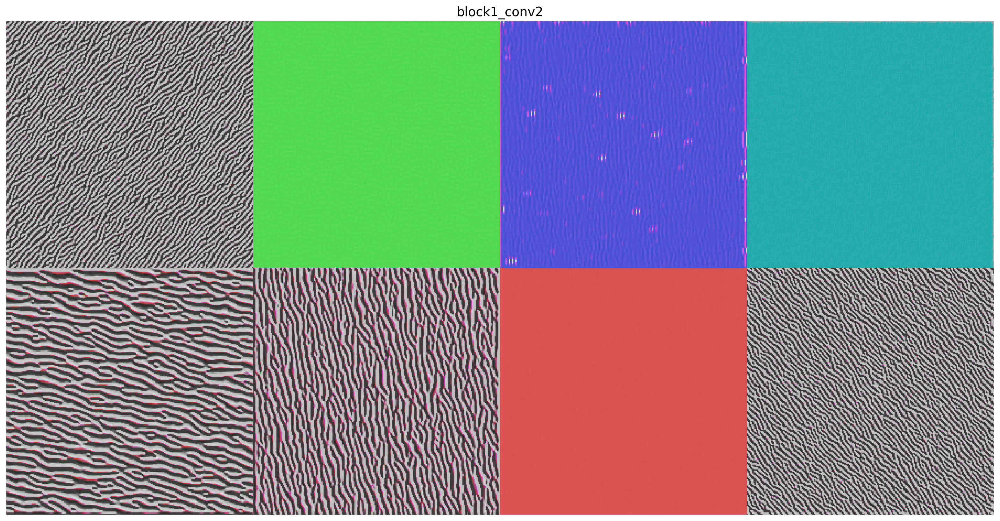

Step 0, Loss: -9.323192596435547
Step 50, Loss: -122.05238342285156
Step 100, Loss: -248.4698486328125
Step 150, Loss: -384.679931640625
Step 200, Loss: -525.28759765625
Step 250, Loss: -668.1915893554688
Step 0, Loss: -4.0935187339782715
Step 50, Loss: -105.54066467285156
Step 100, Loss: -215.33457946777344
Step 150, Loss: -329.6291809082031
Step 200, Loss: -446.15203857421875
Step 250, Loss: -563.7021484375
Step 0, Loss: -17.19869613647461
Step 50, Loss: -245.7774658203125
Step 100, Loss: -499.5635681152344
Step 150, Loss: -762.9580688476562
Step 200, Loss: -1029.8759765625
Step 250, Loss: -1299.0283203125
Step 0, Loss: -11.87927532196045
Step 50, Loss: -210.1619110107422
Step 100, Loss: -424.6980895996094
Step 150, Loss: -649.4320678710938
Step 200, Loss: -878.6666870117188
Step 250, Loss: -1109.89599609375
Step 0, Loss: -6.540949821472168
Step 50, Loss: -138.3314971923828
Step 100, Loss: -284.44091796875
Step 150, Loss: -436.6969909667969
Step 200, Loss: -591.332275390625
Step 250,

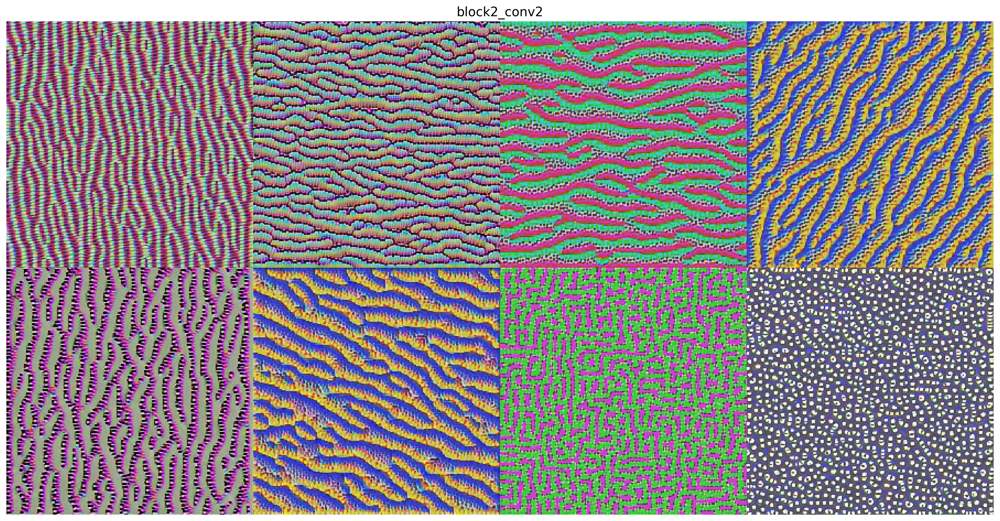

Step 0, Loss: -0.5872719287872314
Step 50, Loss: -245.84715270996094
Step 100, Loss: -568.4409790039062
Step 150, Loss: -907.6322631835938
Step 200, Loss: -1255.4027099609375
Step 250, Loss: -1608.3734130859375
Step 0, Loss: -7.853536605834961
Step 50, Loss: -249.51156616210938
Step 100, Loss: -508.5201416015625
Step 150, Loss: -781.3782958984375
Step 200, Loss: -1060.6949462890625
Step 250, Loss: -1344.357177734375
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -10.029987335205078
Step 50, Loss: -393.7250061035156
Step 100, Loss: -924.4478759765625
Step 150, Loss: -1463.4228515625
Step 200, Loss: -2005.344970703125
Step 250, Loss: -2550.532958984375
Step 0, Loss: -12.089555740356445
Step 50, Loss: -366.7747802734375
Step 100, Loss: -768.0318603515625
Step 150, Loss: -1197.7655029296875
Step 200, Loss: -1641.348388671875
Step 250, Loss: -2092.220703125
Step 0, Loss: -2.7692790031433105
Step 50, Lo

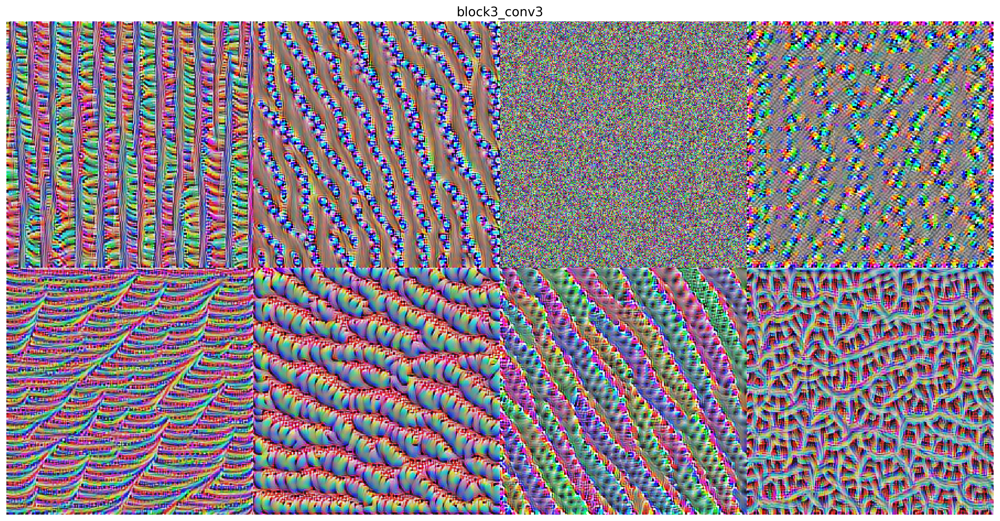

Step 0, Loss: -1.050063967704773
Step 50, Loss: -53.95751953125
Step 100, Loss: -145.02626037597656
Step 150, Loss: -245.399169921875
Step 200, Loss: -348.27099609375
Step 250, Loss: -452.16314697265625
Step 0, Loss: -0.9323716163635254
Step 50, Loss: -154.5308074951172
Step 100, Loss: -361.9034729003906
Step 150, Loss: -589.0454711914062
Step 200, Loss: -822.9054565429688
Step 250, Loss: -1060.23046875
Step 0, Loss: -2.0172290802001953
Step 50, Loss: -320.3034362792969
Step 100, Loss: -703.0521240234375
Step 150, Loss: -1114.4661865234375
Step 200, Loss: -1539.6556396484375
Step 250, Loss: -1972.037109375
Step 0, Loss: -0.02704482711851597
Step 50, Loss: -11.25520133972168
Step 100, Loss: -74.84435272216797
Step 150, Loss: -168.0643310546875
Step 200, Loss: -315.79144287109375
Step 250, Loss: -544.3092651367188
Step 0, Loss: -1.364658236503601
Step 50, Loss: -136.13829040527344
Step 100, Loss: -301.9792785644531
Step 150, Loss: -483.521728515625
Step 200, Loss: -674.0426635742188
Step

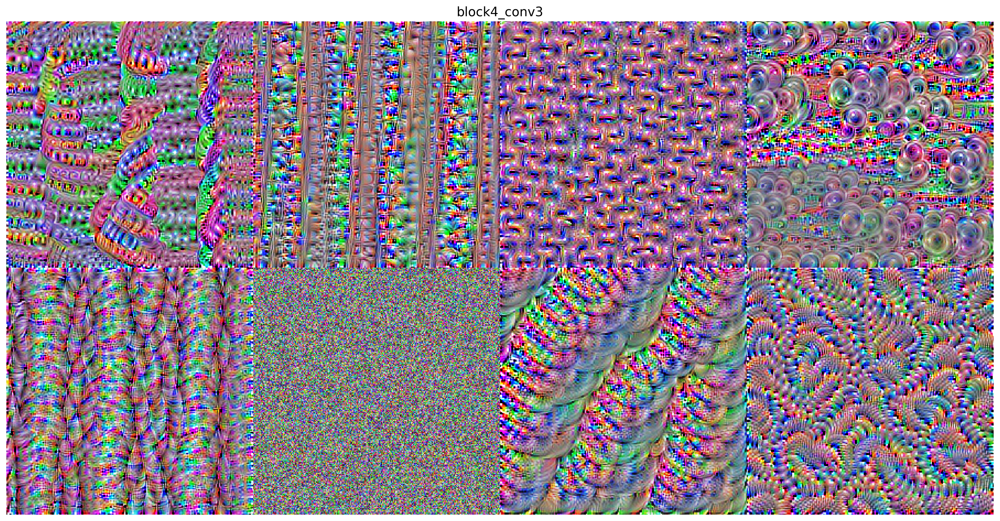

Step 0, Loss: -0.11910190433263779
Step 50, Loss: -74.1333999633789
Step 100, Loss: -171.6128387451172
Step 150, Loss: -279.6017761230469
Step 200, Loss: -391.87799072265625
Step 250, Loss: -507.23309326171875
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Loss: -0.0
Step 150, Loss: -0.0
Step 200, Loss: -0.0
Step 250, Loss: -0.0
Step 0, Loss: -0.0
Step 50, Loss: -0.0
Step 100, Los

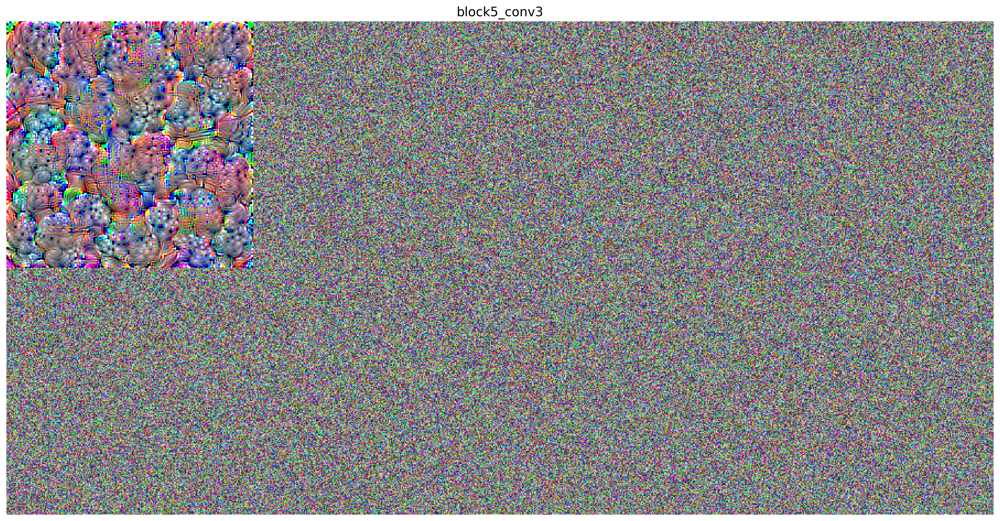

In [ ]:
# Datos iniciales
model = VGG16(weights='imagenet', include_top=True)
max_filters = 40
selected_indices = []
vis_images = [[], [], [], [], []]
selected_filters = [
    [0, 3, 11, 25, 26, 33, 42, 62],
    [8, 21, 23, 38, 39, 45, 50, 79],
    [40, 48, 52, 54, 81, 107, 224, 226],
    [58, 79, 86, 216, 307, 426, 497, 509],
    [2, 7, 41, 84, 103, 306, 461, 487]
]

for i, layer_name in enumerate(['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']):
    layer_idx = [layer.name for layer in model.layers].index(layer_name)

    # Visualize selected filters in this layer
    filters = selected_filters[i] if selected_filters else sorted(np.random.permutation(get_num_filters(model.layers[layer_idx]))[:max_filters])
    selected_indices.append(filters)

    # Generate input image for each filter
    for idx in filters:
        img = visualize_activation(model, layer_name, idx, tv_weight=0.05, max_iter=300)
        if img is not None:
            vis_images[i].append(img)

    # Generate stitched image palette with 4 cols
    if vis_images[i]:
        stitched = stitch_images(vis_images[i], cols=4)
        plt.figure(figsize=(20, 30))
        plt.title(layer_name)
        plt.axis('off')
        plt.imshow(stitched)
        plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16

# Función para agregar texto a una imagen
def add_text_to_image(img, text):
    from PIL import Image, ImageDraw, ImageFont
    img_pil = Image.fromarray(img)
    draw = ImageDraw.Draw(img_pil)
    font = ImageFont.load_default()
    draw.text((10, 10), text, font=font, fill=(255, 0, 0))
    return np.array(img_pil)

# Cargar el modelo VGG16
model = VGG16(weights='imagenet', include_top=True)

# Supongamos que vis_images ya ha sido generada anteriormente
new_vis_images = [[], [], [], [], []]
i = 0
for layer_name in ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']:
    layer_idx = find_layer_idx(model, layer_name)  # Asegúrate de definir esta función según tu implementación

    # Generar imagen de entrada para cada filtro.
    for j, idx in enumerate(selected_indices[i]):
        # Aquí, usa el índice del filtro de la manera que sea adecuada en la implementación de visualize_activation
        img = visualize_activation(model, layer_idx, filter_index=idx)  # Cambia 'filter_index' según sea necesario
        if img is not None:
            img = add_text_to_image(img, f'Filter {idx}')
            new_vis_images[i].append(img)

    # Generar imagen compuesta con 4 columnas
    if new_vis_images[i]:
        n_cols = 4
        size = new_vis_images[i][0].shape[0]
        n_rows = (len(new_vis_images[i]) + n_cols - 1) // n_cols
        display_grid = np.zeros((n_rows * size, n_cols * size, 3))

        for j, img in enumerate(new_vis_images[i]):
            row = j // n_cols
            col = j % n_cols
            display_grid[row * size:(row + 1) * size, col * size:(col + 1) * size] = img

        plt.figure(figsize=(20, 30))
        plt.title(layer_name)
        plt.axis('off')
        plt.imshow(display_grid)
        plt.show()
    i += 1


In [ ]:
for layer in model.layers:
    print(layer.name)


input_layer_29
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten
fc1
fc2
predictions


In [ ]:
import tensorflow as tf
print(tf.version)

<module 'tensorflow._api.v2.version' from '/usr/local/lib/python3.10/dist-packages/tensorflow/_api/v2/version/__init__.py'>
